<a href="https://colab.research.google.com/github/ZG3Z/BTS-Weather-Clustering/blob/main/BTS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [11]:
import warnings
warnings.filterwarnings('ignore')



---

* The data covers the entire year of 2017 and includes all operators.
* The analysis assumes familiarity with the year of the data (indicators), so this information is not emphasized.
* The term "station" refers to the base station (BTS).



# Imports and Data Loading

In [12]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import missingno as msno
%matplotlib inline

from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

from scipy.cluster.hierarchy import dendrogram, linkage

In [13]:
pd.set_option('display.max_rows', 20)
sns.set(style='whitegrid')

In [14]:
date_parser = lambda x: pd.to_datetime(x, format='%d.%m.%Y %H:%M')

In [15]:
bts_anomalies = pd.read_excel('bts_anomalie_pct.xlsx')
bts = pd.read_csv('bts.csv', sep=',')
station_codes = pd.read_csv('kody_stacji.csv', encoding='cp1250', sep=';')
param_codes = pd.read_csv('kody_parametr.csv', encoding='cp1250', sep=';')

df_A_17_H1 = pd.read_csv('A_2017_H1.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_A_17_H2 = pd.read_csv('A_2017_H2.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_B_17_H1 = pd.read_csv('B_2017_H1.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_B_17_H2 = pd.read_csv('B_2017_H2.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_C_17_H1 = pd.read_csv('C_2017_H1.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_C_17_H2 = pd.read_csv('C_2017_H2.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_D_17 = pd.read_csv('D_2017.csv', encoding='cp1250', sep=';', decimal=',', dtype={'ID_stacji': int}, parse_dates=['Data_godzina'], date_parser=date_parser, nrows=191476)
df_E_17_H1 = pd.read_csv('E_2017_H1.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)
df_E_17_H2 = pd.read_csv('E_2017_H2.csv', encoding='cp1250', sep=';', decimal=',', parse_dates=['Data_godzina'], date_parser=date_parser)

# Data Preparation

## Data Integration

In [16]:
# The function transforms parameter data into a more convenient form
# and averages measurements to daily values.
def prepare_and_average_daily_data(df1, df2=pd.DataFrame(), title=''):
  df = pd.concat([df1, df2])
  df.drop(columns=['Parametr'], inplace=True)
  df = df.groupby(['ID_stacji', df['Data_godzina'].dt.to_period('D')])['Wartość'].mean().reset_index()
  df['Wartość'] = round(df['Wartość'], 1)
  df.rename(columns={'Data_godzina': 'Data', 'Wartość': title}, inplace=True)
  return df

# The function merges data frames into one data frame
# based on a specified key and merge method.
def merge_dfs(dataframes, on=None, how='inner'):
  result_df = dataframes[0]
  for df in dataframes[1:]:
    result_df = pd.merge(result_df, df, on=on, how=how)
  return result_df

# The function splits the data frame into two data frames based on a logical mask.
def split_df_by_mask(df, mask):
  return df[~mask], df[mask]

In [17]:
# Preparing a data frame for each parameter separately.

A = prepare_and_average_daily_data(df_A_17_H1, df_A_17_H2, 'Parameter_A')
B = prepare_and_average_daily_data(df_B_17_H1, df_B_17_H2, 'Parameter_B')
C = prepare_and_average_daily_data(df_C_17_H1, df_C_17_H2, 'Parameter_C')
D = prepare_and_average_daily_data(df_D_17, title='Parameter_D')
E = prepare_and_average_daily_data(df_E_17_H1, df_E_17_H2, 'Parameter_E')

In [18]:
# Merging all parameters into one data frame.

params_list = [A, B, C, D, E]

df_params = merge_dfs(params_list, on=['ID_stacji', 'Data'], how='outer')
df_params = df_params.pivot(index='ID_stacji', columns='Data', values=['Parameter_A', 'Parameter_B', 'Parameter_C', 'Parameter_D', 'Parameter_E'])
df_params.columns = [f'{col[0]} {col[1]}' for col in df_params.columns]
df_params = df_params.reset_index()

In [19]:
# The function combines and transforms data from three different data frames.
def merge_and_transform(df_main, df_to_merge1, join_column1, join_column2, df_to_merge2, columns_to_drop, columns_to_rename, column_prefix):
  merged_df = pd.merge(df_main, df_to_merge1, how='left', left_on=join_column1, right_on=join_column2)
  merged_df = pd.merge(merged_df, df_to_merge2, on='bts_id')
  merged_df.drop(columns=columns_to_drop, inplace=True)
  merged_df.rename(columns=columns_to_rename, inplace=True)
  new_columns = list(merged_df.columns[:-12]) + [column_prefix + col for col in merged_df.columns[-12:]]
  merged_df.columns = new_columns
  return merged_df

In [20]:
# Formatting the merging columns that contain information about the station and its location.

bts.lokalizacja = bts.lokalizacja.str.strip()
station_codes['Nazwa'] = station_codes['Nazwa'].str.title()

# Merging data and creating a frame containing comprehensive information about stations, their location, parameters, and faultiness.

df_bts = station_codes.merge(df_params, how='outer', left_on='ID', right_on='ID_stacji')
df_bts = merge_and_transform(bts, df_bts, 'lokalizacja', 'Nazwa', bts_anomalies.iloc[:,:-12], ['ID', 'ID_stacji', 'Nazwa'], {'bts_id': 'ID_bts', 'siec': 'Network', 'standard': 'Standard','lokalizacja': 'Location', 'Szerokość geograficzna': 'Latitude', 'Długość geograficzna': 'Longitude'}, 'Anomaly ')

## Data Set Analysis

In [21]:
# Checking basic information about the data structure.

df_bts.head()

,ID_bts,Network,Standard,Location,Latitude,Longitude,Parameter_A 2017-01-01,Parameter_A 2017-01-02,Parameter_A 2017-01-03,Parameter_A 2017-01-04,...,Anomaly 2017-03,Anomaly 2017-04,Anomaly 2017-05,Anomaly 2017-06,Anomaly 2017-07,Anomaly 2017-08,Anomaly 2017-09,Anomaly 2017-10,Anomaly 2017-11,Anomaly 2017-12
0,0,Konkurent_2,LTE IOT,Nowy Wiśnicz,NaN,NaN,NaN,NaN,NaN,NaN,...,0.11,0.10,0.08,0.15,0.00,0.10,0.11,0.02,0.10,0.03
1,1,Konkurent_2,GSM LTE,Piaski,NaN,NaN,NaN,NaN,NaN,NaN,...,0.12,0.12,0.09,0.10,0.12,0.07,0.15,0.06,0.13,0.02
2,2,Orange,GSM,Katowice,NaN,NaN,NaN,NaN,NaN,NaN,...,0.07,0.07,0.03,0.10,0.00,0.02,0.13,0.08,0.02,0.10
3,3,Konkurent_2,LTE,Sępopol,NaN,NaN,NaN,NaN,NaN,NaN,...,0.02,0.12,0.00,0.04,0.07,0.11,0.13,0.14,0.02,0.02
4,4,Konkurent_3,LTE,Debrzno,NaN,NaN,NaN,NaN,NaN,NaN,...,0.12,0.14,0.10,0.02,0.12,0.00,0.14,0.00,0.15,0.13


In [22]:
df_bts.shape

(10001, 1843)

In [23]:
df_bts.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10001 entries, 0 to 10000
Columns: 1843 entries, ID_bts to Anomaly 2017-12
dtypes: float64(1837), int64(1), object(5)
memory usage: 140.7+ MB


### Categorical Variables


In [24]:
print('Number of unique values:\n{}\n'.format(df_bts.iloc[:,:4].nunique()))
print('Number of missing values:\n{}\n'.format(df_bts.iloc[:,:4].isnull().sum()))
print('General information about columns:')
df_bts.iloc[:,:4].info()

Number of unique values:
ID_bts      9918
Network        4
Standard      31
Location     916
dtype: int64

Number of missing values:
ID_bts      0
Network     0
Standard    0
Location    0
dtype: int64

General information about columns:
<class 'pandas.core.frame.DataFrame'>
Int64Index: 10001 entries, 0 to 10000
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   ID_bts    10001 non-null  int64 
 1   Network   10001 non-null  object
 2   Standard  10001 non-null  object
 3   Location  10001 non-null  object
dtypes: int64(1), object(3)
memory usage: 390.7+ KB


Analyzing the data, discrepancies between the data frame structure and station identification numbers are noticeable, leading to suspicions of potential duplicated records. Additionally, the number of unique locations suggests that there may be more than one base station in a single geographic area.

### Numerical Variables


In [25]:
# Selecting location data from the data frame and eliminating duplicated occurrences
# to facilitate data exploration.

loc = df_bts.iloc[:, 3:6]
loc.drop_duplicates(inplace=True)
loc.reset_index(drop=True, inplace=True)
loc.head()

,Location,Latitude,Longitude
0,Nowy Wiśnicz,NaN,NaN
1,Piaski,NaN,NaN
2,Katowice,NaN,NaN
3,Sępopol,NaN,NaN
4,Debrzno,NaN,NaN


In [26]:
labels={'variable': 'Kolumna', 'index': 'Number of coordinates', 'value': 'Number of locations'}

fig = px.bar(loc['Location'].value_counts().value_counts(), labels=labels, title='Number of locations based on the count of coordinates')
fig.update_traces(marker_color='grey', showlegend=False)
fig.update_layout(xaxis_title='Number of coordinates', yaxis_title='Number of locations')
fig.show()

The presented chart indicates that for six locations, the occurrence of two pairs of coordinates was observed.

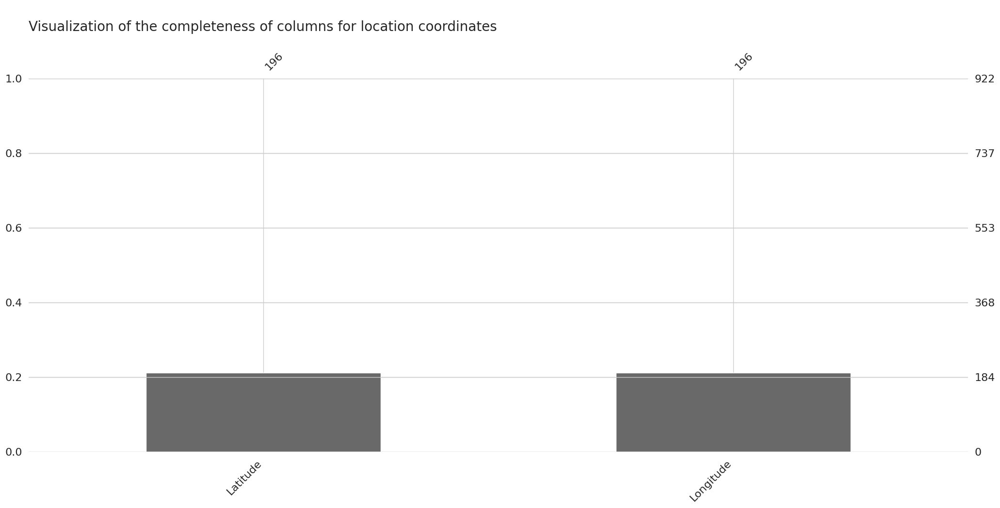

In [27]:
msno.bar(loc.iloc[:, 1:])
plt.title('\nVisualization of the completeness of columns for location coordinates\n', fontsize=20, loc='left')
plt.show()

In the majority of cases, up to 80% of geographical coordinates have missing or undefined values, encompassing both latitude and longitude.

In [28]:
param_codes

,Kod,Nazwa
0,A,Temperatura powietrza
1,B,Temperatura gruntu
2,C,Średnia prędkość wiatru
3,D,Suma opadu dobowego
4,E,Wilgotność względna powietrza


In [29]:
weather_dict = {
  'Parameter_A': 'Air Temperature',
  'Parameter_B': 'Ground Temperature',
  'Parameter_C': 'Wind Speed',
  'Parameter_D': 'Precipitation',
  'Parameter_E': 'Air Humidity'
}

In [30]:
param_cols = [k for k in df_params.columns if k.startswith('Parameter')]
anomaly_cols = [p for p in df_bts.columns if p.startswith('Anomaly')]

In [31]:
# The function transforms the data frame into a more convenient form
# by pivoting columns into rows based on specified parameters.
def melt_df(df, index_col, drop_cols, drop_cols2, date_cols):
  df_melt = df.drop(drop_cols, axis=1).drop(drop_cols2, axis=1)
  df_melt.drop_duplicates(subset=index_col, inplace=True)
  df_melt.set_index(index_col, inplace=True)
  df_melt = df_melt.reset_index()
  df_melt = df_melt.melt(id_vars=index_col, var_name='Column', value_name='Value')
  date = [x.split()[1] for x in df_melt['Column']]
  df_melt[date_cols] = [x.split('-') for x in date]
  df_melt['Column'] = [x.split()[0] for x in df_melt['Column']]
  return df_melt

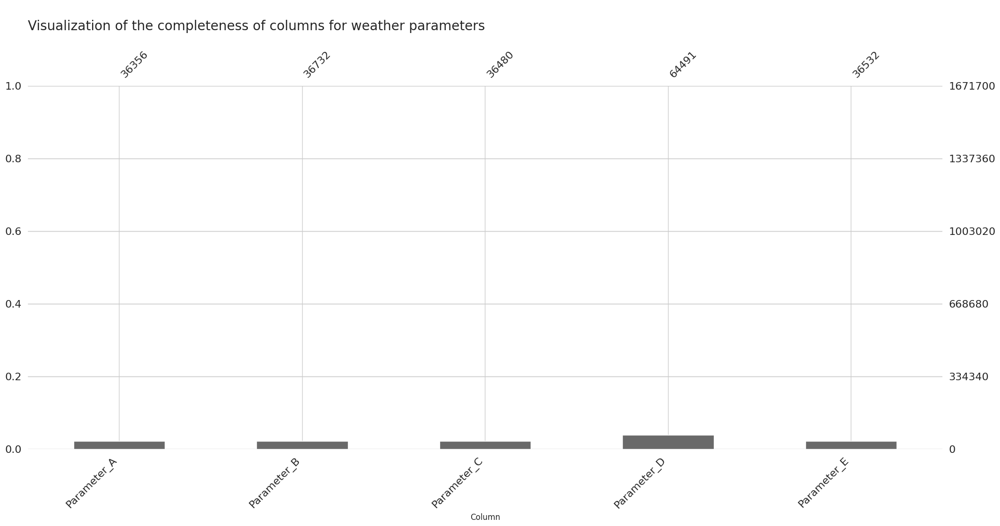

In [32]:
params = melt_df(df_bts, 'Location', ['ID_bts', 'Network', 'Standard', 'Latitude', 'Longitude'], anomaly_cols, ['Year', 'Month', 'Day']).reset_index()

msno.bar(params.pivot(columns='Column', values='Value'))
plt.title('\nVisualization of the completeness of columns for weather parameters\n', fontsize=20, loc='left')
plt.show()

Data analysis indicates that, on average, 97% to 98% of daily measurements for weather parameters are missing. Additionally, each of the five parameters exhibits a similar degree of missing data.

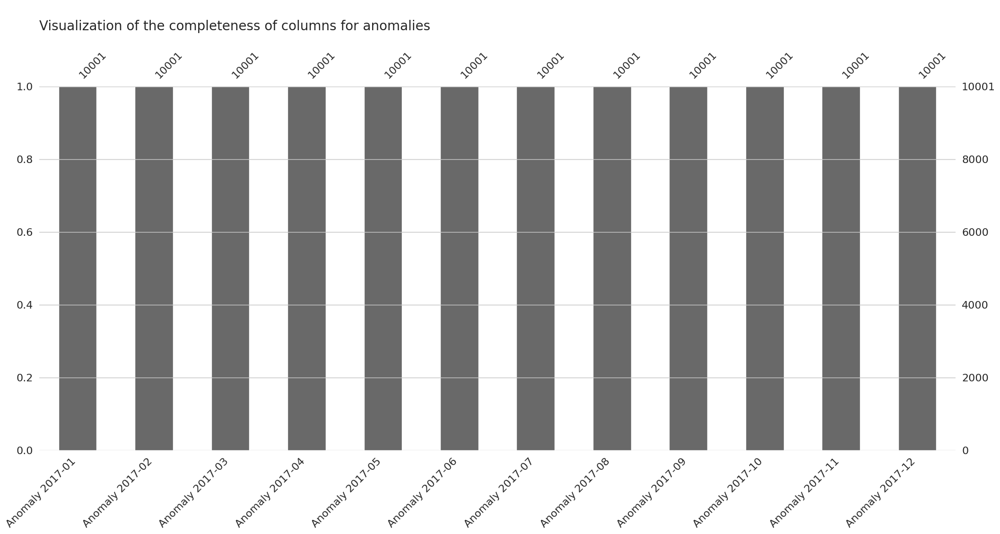

In [33]:
msno.bar(df_bts.iloc[:,-12:])
plt.title('\nVisualization of the completeness of columns for anomalies\n', fontsize=20, loc='left')
plt.show()

For each month, columns containing anomaly percentages are fully populated.

## Data Cleaning

In [34]:
# Splitting the Data into Two Separate Sets of Records
# One containing duplicated geographic coordinates
# and those that occur only once.

duplicated = df_bts.drop(['Network', 'Standard'], axis=1).drop(anomaly_cols, axis=1).duplicated(subset='ID_bts', keep=False)
sub_unique, sub_double = split_df_by_mask(df_bts.drop(['Network', 'Standard'], axis=1).drop(anomaly_cols, axis=1), duplicated)

# Replacing selected data columns with NaN values and removing duplicates
# thereby eliminating potential data errors.

group_cols = sub_double.groupby('Location')[param_cols].transform(lambda x: np.nan)
other_cols = sub_double.drop(param_cols, axis=1)
sub_double[param_cols] = group_cols
sub_double.drop(['ID_bts'], axis=1, inplace=True)
sub_double.drop_duplicates(subset='Location', inplace=True)

In [35]:
# The function converts degrees, minutes, and seconds to decimal degrees.
def dms_to_decimal(dms):
  degrees, minutes, seconds = map(float, dms.split())
  decimal = degrees + minutes / 60 + seconds / 3600
  return decimal

# The function geocodes locations in the data frame using the Nominatim geocoding service.
def geocode_locations(df):
  geolocator = Nominatim(user_agent="user_agent")
  max_retries = 3

  locations = df.Location.unique()

  for location in locations:
    for _ in range(max_retries):
      try:
        data = geolocator.geocode(location + ", Polska", timeout=5)
        if data:
          df.loc[df['Location'] == location, 'Latitude'] = data.latitude
          df.loc[df['Location'] == location, 'Longitude'] = data.longitude
          break
      except GeocoderTimedOut:
        print(f"Geocoding timed out for location: {location}. Retrying...")
      except Exception as e:
        print(f"Error during geocoding for location {location}: {e}")

In [36]:
# Splitting duplicate-free data into subsets based on the criterion
# of having both geographical coordinates.

df_geo = sub_unique.drop(columns=['ID_bts'], axis=1).drop_duplicates(subset='Location')
non_geo = df_geo['Latitude'].isna() | df_geo['Longitude'].isna()
sub_geo, sub_non_geo = split_df_by_mask(df_geo, non_geo)

In [37]:
# Applying the function that converts degrees, minutes, and seconds to decimal degrees
# to the columns of latitude and longitude in the subset that has both coordinates.

sub_geo['Latitude'] = sub_geo['Latitude'].apply(dms_to_decimal)
sub_geo['Longitude'] = sub_geo['Longitude'].apply(dms_to_decimal)

In [38]:
# Filling in geographical coordinates,
# both for the set with duplicates and for the subset
# that did not meet the criterion of having both coordinates,
# using the location geocoding function.

geocode_locations(sub_double)
geocode_locations(sub_non_geo)

In [39]:
df_loc = pd.concat([sub_double, sub_non_geo, sub_geo]).reset_index(drop=True)

In [40]:
# Splitting the data frame into two subsets - one containing records
# with all weather parameters and the other including those
# with at least one missing value in any of the parameters.

empty = df_loc[param_cols].isna().any(axis=1)
sub_full, sub_empty = split_df_by_mask(df_loc, empty)

In [41]:
fig = px.scatter_mapbox(sub_full, lat='Latitude', lon='Longitude', hover_name="Location", title='Locations where all weather parameters are known', color_discrete_sequence=['grey'])
fig.update_layout(margin={'r': 0, 't': 50, 'l': 0, 'b': 0}, mapbox_style='carto-positron', mapbox_center={"lat": 51.9, 'lon': 19.1}, mapbox_zoom=5, dragmode='lasso')
fig.show()

The distribution of locations with a full set of parameters on the map is even across the entire analyzed area.

In [42]:
# The function utilizes the k-nearest neighbors model
# to estimate the most similar results for missing columns based on the nearest known data.
def impute_with_knn(df_train, df_empty, train_columns, columns_to_impute, n_neighbors):
  training_data = df_train[train_columns]
  training_values = df_train[columns_to_impute]

  knn_model = KNeighborsRegressor(n_neighbors=n_neighbors)
  knn_model.fit(training_data, training_values)

  for index, row in df_empty.iterrows():
    train_values = [row[column] for column in train_columns]
    data = [train_values]
    imputed_values = knn_model.predict(data)
    for i, column_name in enumerate(columns_to_impute):
      if pd.isna(df_empty.at[index, column_name]):
        df_empty.at[index, column_name] = round(imputed_values[0][i], 1)

  return df_empty

In [43]:
# Applying data imputation using the k-nearest neighbors model
# to estimate the most similar result of weather data based on geographical coordinates.

sub_empty = impute_with_knn(sub_full, sub_empty, ['Latitude', 'Longitude'], param_cols, 3)

In [44]:
# Merging data and creating a frame containing comprehensive information about stations, their location, parameters, and faultiness.

df_loc = pd.concat([sub_full, sub_empty]).reset_index(drop=True)
df_bts = merge_and_transform(bts, df_loc, 'lokalizacja', 'Location', bts_anomalies.iloc[:,:-12], ['lokalizacja'], {'bts_id': 'ID_bts', 'siec': 'Network', 'standard': 'Standard'}, 'Anomaly ')
df_bts.head()

,ID_bts,Network,Standard,Location,Latitude,Longitude,Parameter_A 2017-01-01,Parameter_A 2017-01-02,Parameter_A 2017-01-03,Parameter_A 2017-01-04,...,Anomaly 2017-03,Anomaly 2017-04,Anomaly 2017-05,Anomaly 2017-06,Anomaly 2017-07,Anomaly 2017-08,Anomaly 2017-09,Anomaly 2017-10,Anomaly 2017-11,Anomaly 2017-12
0,0,Konkurent_2,LTE IOT,Nowy Wiśnicz,49.915267,20.462168,9.3,8.4,7.3,7.5,...,0.11,0.10,0.08,0.15,0.00,0.10,0.11,0.02,0.10,0.03
1,1,Konkurent_2,GSM LTE,Piaski,50.153203,19.475127,8.7,8.2,6.9,6.5,...,0.12,0.12,0.09,0.10,0.12,0.07,0.15,0.06,0.13,0.02
2,2,Orange,GSM,Katowice,50.259899,19.021585,9.0,8.1,7.4,6.4,...,0.07,0.07,0.03,0.10,0.00,0.02,0.13,0.08,0.02,0.10
3,3,Konkurent_2,LTE,Sępopol,54.264716,21.014646,5.8,5.7,6.9,4.8,...,0.02,0.12,0.00,0.04,0.07,0.11,0.13,0.14,0.02,0.02
4,4,Konkurent_3,LTE,Debrzno,53.53861,17.233868,7.7,8.4,6.8,5.0,...,0.12,0.14,0.10,0.02,0.12,0.00,0.14,0.00,0.15,0.13


# Exploratory Data Analysis

## Comparison of the Orange network with competing networks

In [45]:
colors = {
  'Orange': 'darkorange',
  'Konkurent_1': 'lightgray',
  'Konkurent_2': 'gray',
  'Konkurent_3': 'darkgray'
}

In [46]:
network_counts = df_bts['Network'].value_counts().reset_index()

fig = px.bar(network_counts, x='index', y='Network', color='index', color_discrete_map=colors, labels={'index': 'Service provider', 'Network': 'Quantity'})
fig.update_layout(title='Number of BTS stations for each service provider', xaxis_title='Service provider', yaxis_title='Number of stations')
fig.show()

In [47]:
# The function counts the number of different standards supported
# by stations for specific network operators.
def count_network_standards(df):
  df_copy = df.copy()
  df_copy['Standard'] = df_copy['Standard'].str.strip().replace('\s+', ' ', regex=True)

  df_copy['GSM'] = 0
  df_copy['LTE'] = 0
  df_copy['UMTS'] = 0
  df_copy['5G'] = 0
  df_copy['IOT'] = 0

  for index, row in df_copy.iterrows():
    if 'GSM' in row['Standard']:
      df_copy.at[index, 'GSM'] = 1
    if 'LTE' in row['Standard']:
      df_copy.at[index, 'LTE'] = 1
    if 'UMTS' in row['Standard']:
      df_copy.at[index, 'UMTS'] = 1
    if '5G' in row['Standard']:
      df_copy.at[index, '5G'] = 1
    if 'IOT' in row['Standard']:
      df_copy.at[index, 'IOT'] = 1

  network_standard_counts = df_copy.groupby('Network')[['GSM', 'LTE', 'UMTS', '5G', 'IOT']].sum().reset_index()
  return pd.melt(network_standard_counts, id_vars='Network', var_name='Standard', value_name='Count')

In [48]:
network_standards_counts = count_network_standards(df_bts.iloc[:, 1:3])
labels = {'Network': 'Operator', 'Count': 'Quantity'}

fig = px.bar(network_standards_counts, x='Standard', y='Count', color='Network', barmode='group', color_discrete_map=colors, labels=labels)
fig.update_layout(title='Number of supported standards in BTS stations for each network operator', xaxis_title='Standard', yaxis_title='Quantity')
fig.update_traces(marker=dict(line=dict(color='black', width=0.01)))
fig.show()

There is a clear advantage in the number of Orange operator's stations over the others, especially in the case of LTE, GSM, and UMTS standards.

In [49]:
fig = px.scatter_mapbox(df_bts, lat="Latitude", lon="Longitude", hover_name="Location", color='Network', color_discrete_map=colors, title="Locations of BTS stations for each network operator", labels={'Network': 'Operator'})
fig.update_layout(margin={"r": 0, "t": 50, "l": 0, "b": 0}, mapbox_style='carto-positron', mapbox_center={"lat": 51.9, "lon": 19.1}, mapbox_zoom=5,  dragmode='lasso')
fig.show()

The locations of operator's BTS stations are evenly distributed across the analyzed area.

In [50]:
months_dict = {
  '01': 'January',
  '02': 'February',
  '03': 'March',
  '04': 'April',
  '05': 'May',
  '06': 'June',
  '07': 'July',
  '08': 'August',
  '09': 'September',
  '10': 'October',
  '11': 'November',
  '12': 'December'
}

In [51]:
df_network_anomaly = df_bts.groupby('Network')[anomaly_cols].mean().reset_index()
df_network_anomaly.columns = [f"{months_dict[col.split('-')[1]]}" if col.startswith('Anomaly') else col for col in df_network_anomaly.columns]
df_network_anomaly = pd.melt(df_network_anomaly, id_vars='Network', var_name='Anomaly', value_name='Value')

labels = {'Network': 'Operator', 'Anomaly': 'Month', 'Value': 'Average Standard Deviation of Anomalies'}

fig = px.bar(df_network_anomaly, x='Anomaly', y='Value', color='Network', color_discrete_map=colors, title='Average Monthly Faultiness in BTS stations for each network operator', barmode='group', labels=labels)
fig.show()

The analysis indicates that the average monthly anomaly percentages are noticeably similar across different stations, consistently hovering around 0.075.

## Weather

In [65]:
# Separation of data from weather parameters.

data = df_bts.drop(['ID_bts','Network', 'Standard'], axis=1)
data.drop_duplicates(subset='Location', inplace=True)
loc = data.iloc[:,:3]

In [66]:
def group_and_agg(df, group_cols, aggs, value):
    df_agg = (df.groupby(group_cols)[value].agg(aggs)).reset_index()
    return df_agg

In [67]:
# Consolidation of weather parameter records from daily measurements
# to monthly and yearly, using aggregation measures.
# The process aims to better align appropriate measures with individual parameters.

df_params = melt_df(data, 'Location', ['Longitude', 'Latitude'], anomaly_cols, ['Year', 'Month', 'Day'])

params_month_agg = group_and_agg(df_params, ['Column', 'Location', 'Year', 'Month'], [np.min, np.max, np.mean, np.sum], 'Value')
params_month_agg['range'] = params_month_agg['amax'] - params_month_agg['amin']
params_year_agg = group_and_agg(df_params, ['Column', 'Location', 'Year'], [np.min, np.max, np.mean, np.sum], 'Value')
params_year_agg['range'] = params_year_agg['amax'] - params_year_agg['amin']

In [68]:
# The function prepares data regarding parameters based on the data frame for a more convenient form.
def prepare_parameter_data(data, params, col1_drop, col2_drop, col1, col2):
  params_1, params_2 = split_df_by_mask(data, data['Column'].isin(params))
  params_1.drop(col1_drop, axis=1, inplace=True)
  params_1.rename(columns={col1: 'Value'}, inplace=True)
  params_2.drop(col2_drop, axis=1, inplace=True)
  params_2.rename(columns={col2: 'Value'}, inplace=True)
  df = pd.concat([params_1, params_2])
  df = loc.merge(df, on='Location')
  return df

### Average Weather Values

In [69]:
# The function performs normalization of selected columns
# using Min-Max Scaling for better consistency and data analysis.
def normalize_columns(df, columns_to_normalize):
  df_normalized = df.copy()
  scaler = MinMaxScaler()

  for column in columns_to_normalize:
    if column in df.columns:
      df_normalized[column] = scaler.fit_transform(df[[column]])

  return df_normalized

In [70]:
params_month_mean = prepare_parameter_data(params_month_agg, ['Parameter_D'], ['amin', 'amax', 'range', 'sum'], ['amin', 'amax', 'range', 'mean'], 'mean', 'sum')

params_month_mean_norm = params_month_mean.drop(['Latitude', 'Longitude', 'Year'], axis=1).pivot(index=['Location', 'Month'], columns='Column', values='Value').reset_index()
params_month_mean_norm = normalize_columns(params_month_mean_norm, list(weather_dict.keys()))
params_month_mean_norm = pd.melt(params_month_mean_norm, id_vars=['Location', 'Month'], var_name='Column', value_name='Value')
params_month_mean_norm = pd.DataFrame(params_month_mean_norm.groupby(['Month', 'Column'])['Value'].agg('mean')).rename(columns={'Value': 'Mean'})
params_month_mean_norm.reset_index(inplace=True)
params_month_mean_norm.replace(weather_dict, inplace=True)
params_month_mean_norm.replace(months_dict, inplace=True)
params_month_mean_norm.rename(columns={'Column': 'Parameter', 'Month': 'Month'}, inplace=True)

fig = px.bar(params_month_mean_norm, x='Month', y='Mean', color='Parameter', color_discrete_map=colors, barmode='group',
             title='Distribution of average monthly values of weather parameters', labels={'Mean': 'Normalized Average Value'})
fig.show()

In [71]:
# Function generating an interactive map plot,
# allowing dynamic analysis of spatial and temporal changes for specific categories.
def plot_map_group(df1, param, title,  group):

  range_color_dict = {}
  unique_groups = df1[group].unique()

  for unique_group in unique_groups:
    range_color_min = df1[df1[group] == unique_group][param].min()
    range_color_max = df1[df1[group] == unique_group][param].max()
    range_color_dict[unique_group] = [range_color_min, range_color_max]

  fig = px.scatter_mapbox(
    df1, lat='Latitude', lon='Longitude',
    color=param, hover_name='Location', animation_group=group,
    animation_frame=group, range_color=range_color_dict.get(df1[group].iloc[0]),
    title=title, opacity=0.6, color_continuous_scale='Viridis_r')

  fig.update_layout(
    margin={'r': 0, 't': 50, 'l': 0, 'b': 0}, mapbox_style='carto-positron',
    mapbox_center={'lat': 51.9, 'lon': 19.1}, mapbox_zoom=4.5, dragmode='lasso')

  fig.update_coloraxes(cauto=True)
  fig.show()

In [74]:
params_year_vis = prepare_parameter_data(params_year_agg, ['Parameter_D'], ['amin', 'amax', 'range', 'sum'], ['amin', 'amax', 'range', 'mean'], 'mean', 'sum')
params_year_vis.rename(columns={'Column': 'Parameter'}, inplace=True)
params_year_vis['Parameter'].replace(weather_dict, inplace=True)
plot_map_group(params_year_vis, 'Value', 'Visualization of annual average values of weather parameters', 'Parameter')

In [73]:
params_month_vis = params_month_mean.drop('Year', axis=1)
params_month_vis.rename(columns={'Column': 'Parameter'}, inplace=True)
params_month_vis.replace(weather_dict, inplace=True)
params_month_vis.replace(months_dict, inplace=True)

In [63]:
# Function visualizing monthly data for individual weather parameters.
def param_month_visualize(df, params, titles):
  for i in range(len(params)):
    plot_map_group(df[df['Parameter'] == params[i]], 'Value', titles[i], 'Month')

In [64]:
param_month_visualize(params_month_vis, list(weather_dict.values()), list(weather_dict.values()))

### Extreme Weather Values


In [75]:
# The function identifies outliers in a specified column
# based on the mean and standard deviation.
def extreme_values(df, col, value):
  data = df[df['Column'] == col]
  mean = data[value].mean()
  std = data[value].std()
  extreme_limit = mean + 3 * std
  extreme_values = (data[value] > extreme_limit)
  return data[extreme_values]

# The function identifies locations
# where extreme values are present.
def extreme_loc(df, params, col):
  extreme_loc = pd.DataFrame()
  for param in params:
    ex = extreme_values(df, param, col)
    extreme_loc = pd.concat([extreme_loc, ex])

  return extreme_loc

In [76]:
extreme_params_year = prepare_parameter_data(params_year_agg, ['Parameter_C', 'Parameter_D', 'Parameter_E'],
                                    ['amin', 'amax', 'mean', 'sum'], ['amin', 'amax', 'range', 'mean'], 'range', 'sum')

extreme_params_month = prepare_parameter_data(params_month_agg, ['Parameter_C', 'Parameter_D', 'Parameter_E'],
                                    ['amin', 'amax', 'mean', 'sum'], ['amin', 'amax', 'range', 'mean'], 'range', 'sum')

In [77]:
extreme_year_loc = extreme_loc(extreme_params_year, list(weather_dict.keys()), 'Value')

fig = px.scatter_mapbox(extreme_year_loc, lat='Latitude', lon='Longitude', hover_name="Location", color_discrete_sequence=['grey'],
                        title='Locations characterized by the most significant amplitudes or extreme values in the annual range')

fig.update_layout(margin={'r': 0, 't': 50, 'l': 0, 'b': 0}, mapbox_style='carto-positron', mapbox_center={"lat": 51.9, 'lon': 19.1}, mapbox_zoom=5, dragmode='lasso')
fig.show()

In [78]:
extereme_month_loc = extreme_loc(extreme_params_month, list(weather_dict.keys()), 'Value')
extereme_month_loc = extereme_month_loc.sort_values(by='Month')
extereme_month_loc.replace(months_dict, inplace=True)

fig = px.scatter_mapbox(extereme_month_loc, lat='Latitude', lon='Longitude', hover_name="Location", color_discrete_sequence=['grey'], animation_group='Month', animation_frame='Month',
                        title='Locations characterized by the most significant amplitudes or extreme values in the monthly range')

fig.update_layout( margin={'r': 0, 't': 50, 'l': 0, 'b': 0}, mapbox_style='carto-positron', mapbox_center={'lat': 51.9, 'lon': 19.1}, mapbox_zoom=4.5, dragmode='lasso')
fig.show()

## Faultiness

In [88]:
# Separation of data related to faultiness.

df_anomaly = df_bts.iloc[:, [0,3] + list(range(-12, 0))]
df_anomaly.columns = [f"{col.split('-')[1]}" if col.startswith('Anomaly') else col for col in df_anomaly.columns]

In [89]:
# Generating basic descriptive statistics

df_anomaly.iloc[:, -12:].describe()

,01,02,03,04,05,06,07,08,09,10,11,12
count,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000,9918.000000
mean,0.075358,0.074733,0.074992,0.075390,0.075202,0.075041,0.075687,0.075208,0.075242,0.074538,0.075364,0.074903
std,0.045873,0.046129,0.045936,0.046111,0.046185,0.046278,0.045547,0.045798,0.046391,0.046027,0.046036,0.046024
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040000,0.030000,0.030000,0.040000,0.040000,0.030000,0.040000,0.040000,0.030000,0.030000,0.040000,0.030000
50%,0.080000,0.070000,0.080000,0.080000,0.080000,0.080000,0.080000,0.080000,0.080000,0.070000,0.080000,0.080000
75%,0.110000,0.110000,0.110000,0.120000,0.120000,0.110000,0.110000,0.110000,0.120000,0.110000,0.120000,0.117500
max,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000,0.150000


In [90]:
fig = px.box(df_anomaly.iloc[:, -12:], title='Statistical distribution of faultiness - monthly analysis', labels={'variable': 'Month', 'value': 'Value'})
fig.show()

Analysis of average monthly percentages of anomalies in weather data reveals relative stability at around 0.08. Despite some variability, values remain within a limited range, suggesting regularity in the data distribution.

In [91]:
df_anomaly = pd.melt(df_anomaly, id_vars=['ID_bts', 'Location'], var_name='Anomaly', value_name='Value')

In [92]:
df_anomaly_count = pd.DataFrame(df_anomaly.groupby('Anomaly')['Value'].value_counts()).rename(columns={'Value': 'Count'})
df_anomaly_count.reset_index(inplace=True)
df_anomaly_count.rename(columns={'Anomaly': 'Month'}, inplace=True)
df_anomaly_count['Value'] = df_anomaly_count['Value'].astype(str)
df_anomaly_count.sort_values(by=['Value', 'Month'], inplace=True)
df_anomaly_count.replace(months_dict, inplace=True)

fig = px.bar(df_anomaly_count, x='Month', y='Count', color='Value', color_discrete_map=colors, barmode='group',
             title='Monthly distribution of the number of BTS stations experiencing various percentages of anomalies')
fig.show()

The obtained results do not show a clear dependency in individual months.

In [93]:
df_anomaly = loc.merge(df_anomaly, on='Location')
df_anomaly.sort_values(by=['Anomaly'], inplace=True)
df_anomaly.replace(months_dict, inplace=True)
df_anomaly.rename(columns={'Anomaly': 'Month'}, inplace=True)

# The selected threshold, based on the 75th percentile, will allow for identifying locations where significant deviations from the overall data trend occur.

fig = px.scatter_mapbox(df_anomaly[df_anomaly['Value'] > 0.12],lat='Latitude', lon='Longitude', hover_name="Location", color_discrete_sequence=['grey'], animation_group='Month', animation_frame='Month',
                        title='Locations of stations where anomaly percentages exceed 0.12')

fig.update_layout( margin={'r': 0, 't': 50, 'l': 0, 'b': 0}, mapbox_style='carto-positron', mapbox_center={'lat': 51.9, 'lon': 19.1}, mapbox_zoom=4.5, dragmode='lasso')
fig.show()

The results of the analysis indicate that stations with anomaly percentage values exceeding the threshold of 0.12 are evenly distributed throughout the studied area. There is no clear concentration in specific regions. Such distribution may suggest that anomalies occur without a significant association with specific geographic areas.

# Modeling

## Identification of stations with similar weather conditions and faultiness


In [94]:
# Function preparing a data frame for clustering.
def prepare_df_to_clustering(df):
  parameters = df
  parameters['Month'] = parameters['Month'].astype(int)
  parameters = parameters.pivot(index='Location', columns=['Column', 'Month'])
  value = 'Value'
  parameters = parameters[value]
  parameters.columns = [f"{col[0]} {col[1]}" for col in parameters.columns]

  df_for_clustering = df_bts.iloc[:,:4].merge(parameters, on='Location')
  df_for_clustering = df_for_clustering.merge(bts_anomalies.iloc[:,:-12], left_on='ID_bts', right_on='bts_id')
  df_for_clustering.drop('bts_id', axis=1, inplace=True)
  df_for_clustering.columns = list(df_for_clustering.columns[:-12]) + [f"Anomaly {int(col.split('-')[1]):01d}" for col in df_for_clustering.columns[-12:]]
  df_for_clustering = df_for_clustering.merge(loc, on='Location')

  return df_for_clustering

In [95]:
# Function calculating the correlation between columns of parameters and faults.
def calculate_correlation(df):
  df_corr = df.melt(id_vars=['ID_bts'], var_name='Column', value_name='Value')
  df_corr[['Column','Month']] = [x.split() for x in df_corr['Column']]
  df_corr = df_corr.pivot(index=['ID_bts', 'Month'], columns=['Column'], values='Value').reset_index()
  return df_corr[list(df_corr.iloc[:,-6:].columns)].corr()

In [96]:
df_cluster = prepare_df_to_clustering(params_month_mean)

In [97]:
correlation = calculate_correlation(df_cluster.drop(['Network', 'Standard', 'Location', 'Longitude', 'Latitude'], axis=1))

fig = px.imshow(correlation, text_auto=True, aspect='auto', color_continuous_scale='Blues', title='Correlation matrix between faults and individual weather parameters')
fig.show()

Based on the analysis of the correlation matrix, no strong relationships between faults and individual parameters were found. All correlation values are close to zero, suggesting a lack of clear correlations.

In [98]:
# Function normalizing data using Standard Scaler.
def normalize_data(data):
  scaler = StandardScaler()
  data_normalized = scaler.fit_transform(data)
  return data_normalized

In [99]:
# Clustering and cluster evaluation function using the selected algorithm (Agglomerative Clustering or KMeans)
# for different cluster sizes.
def cluster_and_evaluate(data, algorithm, n_clusters, method='ward'):
  score_list = []
  X = normalize_data(data)
  for n in n_clusters:
    if algorithm == 'agglomerative':
      model = AgglomerativeClustering(n_clusters=n, linkage=method)
    elif algorithm == 'kmeans':
      model = KMeans(n_clusters=n)

    clusters = model.fit_predict(X)
    data['Cluster'] = clusters

    silhouette = silhouette_score(X, clusters)
    davies_bouldin = davies_bouldin_score(X, clusters)
    calinski_harabasz = calinski_harabasz_score(X, clusters)
    cluster_counts = data['Cluster'].value_counts().sort_index()

    score_list.append((n, silhouette, davies_bouldin, calinski_harabasz, cluster_counts, clusters))

  return score_list

In [100]:
# Function visualizing comparison charts of different cluster quality metrics.
def plot_scores_comparison(n_clusters, score_lists, labels):
  silhouette_scores = [[x[1] for x in score] for score in score_lists]
  davies_bouldin_scores = [[x[2] for x in score] for score in score_lists]
  calinski_harabasz_scores = [[x[3] for x in score] for score in score_lists]

  fig, ax = plt.subplots()
  for i, scores in enumerate(silhouette_scores):
    sns.lineplot(x=n_clusters, y=scores, label=labels[i], ax=ax)
  ax.set(xlabel='Iterations', ylabel='Score')
  plt.title('Silhouette Scores')
  plt.legend(title='Legend')
  plt.show()

  fig, ax = plt.subplots()
  for i, scores in enumerate(davies_bouldin_scores):
    sns.lineplot(x=n_clusters, y=scores, label=labels[i], ax=ax)
  ax.set(xlabel='Iterations', ylabel='Score')
  plt.title('Davies-Bouldin Scores')
  plt.legend(title='Legend')
  plt.show()

  fig, ax = plt.subplots()
  for i, scores in enumerate(calinski_harabasz_scores):
    sns.lineplot(x=n_clusters, y=scores, label=labels[i], ax=ax)
  ax.set(xlabel='Iterations', ylabel='Score')
  plt.title('Calinski-Harabasz Scores')
  plt.legend(title='Legend')
  plt.show()

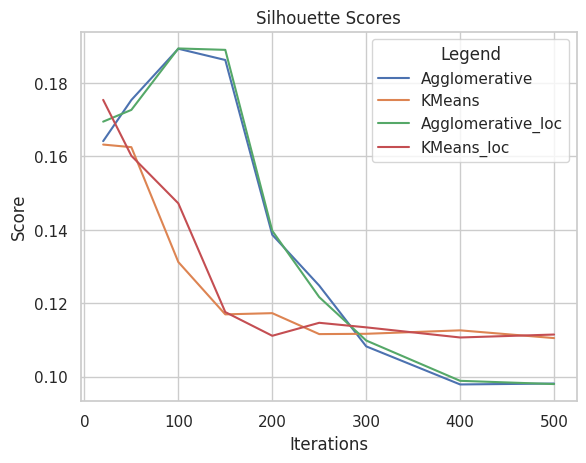

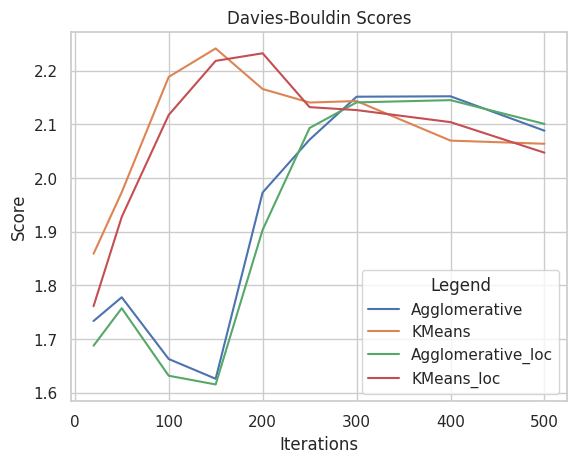

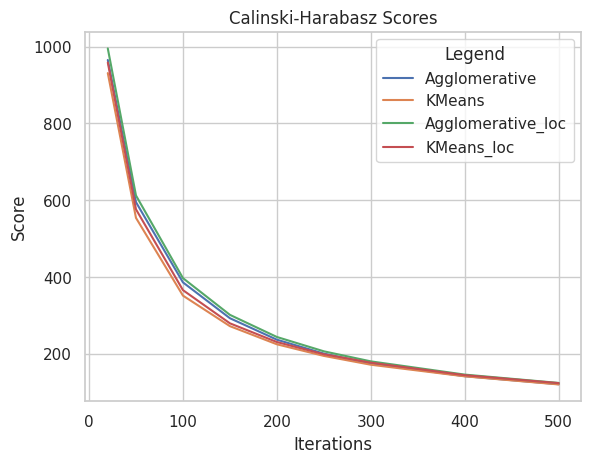

In [101]:
n_clusters = [20, 50, 100, 150, 200, 250, 300, 400, 500]

# Extraction of data for cluster analysis (with and without considering location).

data = df_cluster.drop(['ID_bts', 'Network', 'Standard', 'Location', 'Latitude', 'Longitude'], axis=1)
data_loc = df_cluster.drop(['ID_bts', 'Network', 'Standard', 'Location'], axis=1)

# Cluster analysis using different algorithms.

scores = []
scores.append(cluster_and_evaluate(data, 'agglomerative', n_clusters))
scores.append(cluster_and_evaluate(data, 'kmeans', n_clusters))
scores.append(cluster_and_evaluate(data_loc, 'agglomerative', n_clusters))
scores.append(cluster_and_evaluate(data_loc, 'kmeans', n_clusters))

plot_scores_comparison(n_clusters, scores, ['Agglomerative', 'KMeans', 'Agglomerative_loc', 'KMeans_loc'])

The analysis of the results clearly indicates better performance of data containing location information compared to data without it. This suggests that location may be a key factor. Additionally, it is noticeable that the agglomerative algorithm achieves better results than KMeans in identifying stations with similar weather conditions and faultiness. This, in turn, suggests the potential effectiveness of the agglomerative algorithm in solving this specific problem. Furthermore, the best results were obtained with a cluster number of around 100, indicating an optimal number of clusters for this dataset.

In [102]:
data = df_cluster.drop(['ID_bts', 'Network', 'Standard', 'Location'], axis=1)

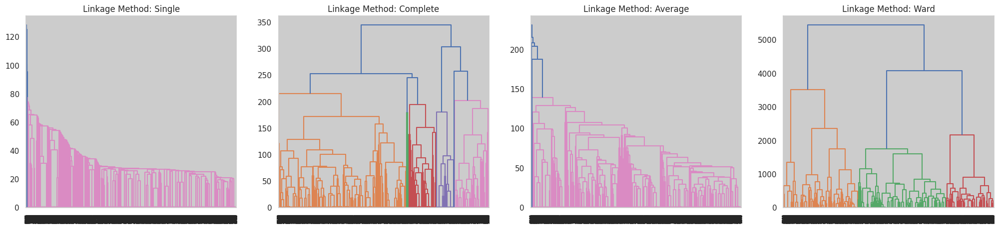

In [103]:
methods = ['single', 'complete', 'average', 'ward']
plt.figure(figsize=(25, 5))

for i, method in enumerate(methods, 1):
    plt.subplot(1, 4, i)
    Z = linkage(data, method)
    dendrogram(Z)
    plt.title(f'Linkage Method: {method.capitalize()}')

plt.show()

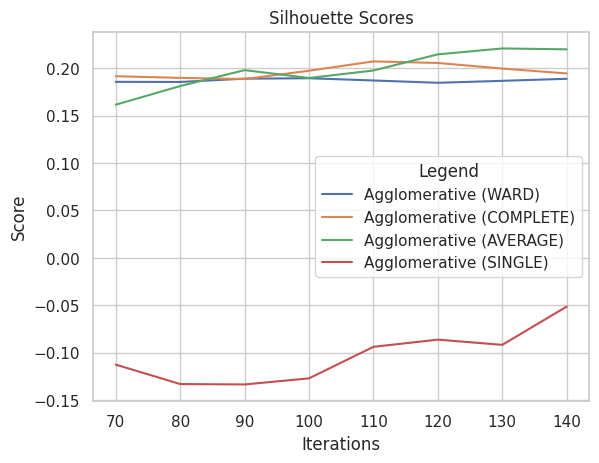

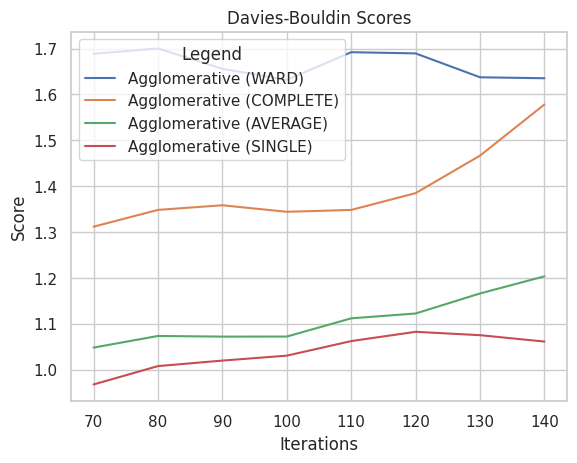

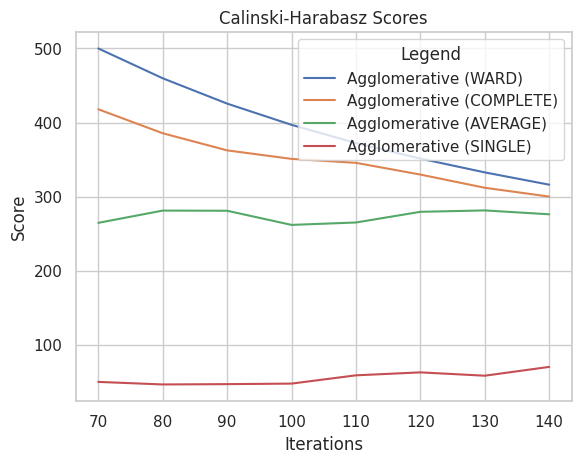

In [104]:
n_clusters = range(70, 150, 10)

scores_agglomerative = []
scores_agglomerative.append(cluster_and_evaluate(data, 'agglomerative', n_clusters, 'ward'))
scores_agglomerative.append(cluster_and_evaluate(data, 'agglomerative', n_clusters, 'complete'))
scores_agglomerative.append(cluster_and_evaluate(data, 'agglomerative', n_clusters, 'average'))
scores_agglomerative.append(cluster_and_evaluate(data, 'agglomerative', n_clusters, 'single'))

plot_scores_comparison(n_clusters, scores_agglomerative, ['Agglomerative (WARD)', 'Agglomerative (COMPLETE)', 'Agglomerative (AVERAGE)', 'Agglomerative (SINGLE)'])

The analysis indicates that the agglomerative algorithm achieves the best results when using the "complete" and "average" linkage methods. Both cases show significantly better results compared to other linkage methods. Importantly, the optimal number of clusters, set at 110, proves to be the most effective choice for the agglomerative algorithm, suggesting that this number facilitates uniform and efficient clustering.


In [105]:
clusters_count_complete = scores_agglomerative[1][4][4]
clusters_count_average = scores_agglomerative[2][4][4]

In [106]:
fig_c = px.bar(clusters_count_complete, labels={'value': 'Number of Stations', 'index': 'Cluster'}, title ='Number of BTS Stations in Clusters - COMPLETE Method')
fig_c.show()
fig_a = px.bar(clusters_count_average, labels={'value': 'Number of Stations', 'index': 'Cluster'}, title ='Number of BTS Stations in Clusters - AVERAGE Method')
fig_a.show()

The analysis of the data quantity in clusters clearly suggests that the complete method brings better benefits, providing a more even distribution of data between clusters. Applying this method results in a more balanced distribution of data in each group.

In [107]:
result = cluster_and_evaluate(data, 'agglomerative', [110], 'complete')
_, silhouette_score, davies_bouldin_score, calinski_harabasz_score, counts_val, clusters = result[0]

data['Cluster'] = clusters

In [108]:
labels = data['Cluster']

pca_3d = PCA(n_components=3)
reduced_data_3d = pca_3d.fit_transform(data)
fig = px.scatter_3d(x=reduced_data_3d[:, 0], y=reduced_data_3d[:, 1], z=reduced_data_3d[:, 2], color=labels, title = 'Spatial distribution of individual clusters')
fig.show()

Spatial analysis of the distribution of clusters shows that there are effectively separated groups of stations characterized by similar weather conditions and fault levels. Clear separation between clusters indicates the effectiveness of the identification and classification method.

In [109]:
data['Cluster'] = clusters

In [110]:
data['Count'] = data.groupby(['Longitude', 'Latitude', 'Cluster'])['Latitude'].transform('count').min()
data.sort_values(by=['Cluster'], inplace=True)

fig = px.scatter_mapbox(data, lat='Latitude', lon='Longitude', hover_name='Cluster', animation_group='Cluster', animation_frame='Cluster', size='Count',
        title='Clusters of BTS station locations with similar weather conditions and faultiness', opacity=0.01, color_discrete_sequence=['black'])
fig.update_layout(margin={'r': 0, 't': 50, 'l': 0, 'b': 0}, mapbox_style='carto-positron', mapbox_center={'lat': 51.9, 'lon': 19.1}, mapbox_zoom=4.5, dragmode='lasso')
fig.show()

# Conclusions

## Impact Assessment of Weather on BTS Outages

The analysis of BTS station data suggests that the impact of weather conditions on outages is complex and inconclusive. The lack of a clear correlation between individual weather parameters and outages suggests that the increase in outages is not directly attributed to specific weather conditions.

Clusters of stations with similar weather conditions and outage patterns indicate that local factors play a crucial role in station stability. Local conditions may influence outages to a degree that is not unambiguously captured in individual weather parameters.

The analysis of monthly average anomaly percentages in weather data shows relative stability, suggesting that despite some variability, the data remains within a certain range. However, stations with higher anomaly percentages are evenly distributed, indicating that anomalies occur without a clear connection to specific geographic areas typically associated with weather conditions.

The conclusion from the analysis is that the impact of weather conditions on BTS outages is more complex than expected. A comprehensive understanding of this phenomenon requires consideration of local conditions and diverse atmospheric factors.

## Ideas for Solution Development and Practical Applications

*   **Extension of Weather Parameters:** Enriching the analysis with additional weather parameters. This would allow for a more precise consideration of specific conditions in a given area and the adaptation of station maintenance strategies to local conditions.

*   **Implementation of Predictive Models:** Utilizing machine learning techniques to predict outages based on weather data. This would enable the development of forecasting tools to anticipate potential issues related to weather conditions and take preventive actions.


